In [41]:
import numpy as np
import astropy.units as u
from astropy.io import fits
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
from scipy.optimize import minimize

import poppy
import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

from adefc_vortex.math_module import xp, xcipy, ensure_np_array
from adefc_vortex import utils
from adefc_vortex.imshows import imshow1, imshow2, imshow3, plot_data
from adefc_vortex import dm
from adefc_vortex import props
from adefc_vortex import aefc_2dm as aefc
import adefc_vortex.fresnel_2dm_96 as fresnel
import adefc_vortex.fraunhofer_2dm_96 as fraunhofer

Nwaves = 15
wavelength_c = 650e-9
bw = 0.10
waves = np.linspace(wavelength_c * (1-bw/2), wavelength_c * (1+bw/2), Nwaves )
bandpasses = waves.reshape(3,5)
print(bandpasses)

Nwaves_per_bp = bandpasses.shape[1]
control_waves = bandpasses[:, Nwaves_per_bp//2]
print(control_waves)

dm1_flat = xp.rot90(xp.rot90( utils.load_fits('../data/dm1_flat_command_96.fits') ))
M = fraunhofer.MODEL()
dm1_flat += 1e-9*xp.random.randn(M.Nact,M.Nact)*M.dm_mask

[[6.17500000e-07 6.22142857e-07 6.26785714e-07 6.31428571e-07
  6.36071429e-07]
 [6.40714286e-07 6.45357143e-07 6.50000000e-07 6.54642857e-07
  6.59285714e-07]
 [6.63928571e-07 6.68571429e-07 6.73214286e-07 6.77857143e-07
  6.82500000e-07]]
[6.26785714e-07 6.50000000e-07 6.73214286e-07]


/home/kianmilani/Projects/adefc-vortex/adefc_vortex


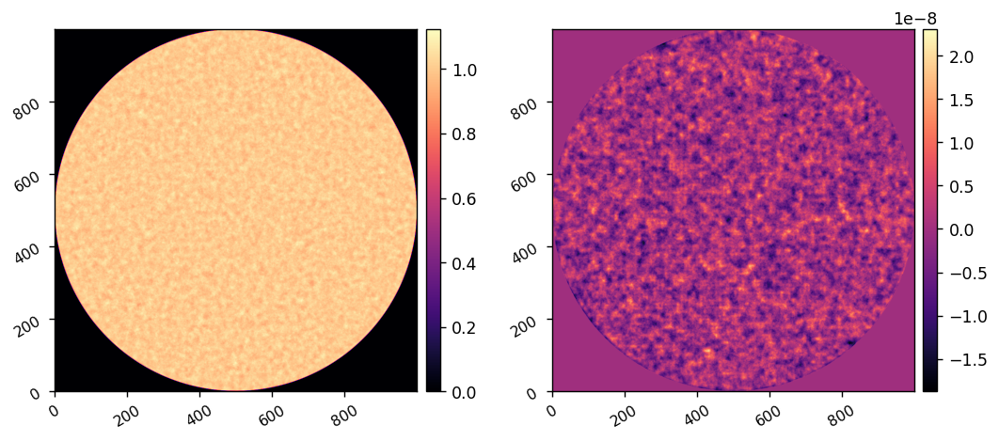

In [40]:
reload(fresnel)
I = fresnel.CORO(
    # dm1_gains=1 + 0.02*xp.random.randn(96,96),
    # dm2_gains=1 + 0.02*xp.random.randn(96,96),
    # inf_fun_coupling=0.17,
    # dm1_shift=np.array([100, 25 ])*u.um,
    # dm2_shift=np.array([-25, -100 ])*u.um,
    # lyot_shift=np.array([-50, -50 ])*u.um,
    dm1_ref=dm1_flat,
)
I.use_opds = True

AMP, OPD = I.calc_pupil()
imshow2(AMP, OPD)

/home/kianmilani/Projects/adefc-vortex/adefc_vortex


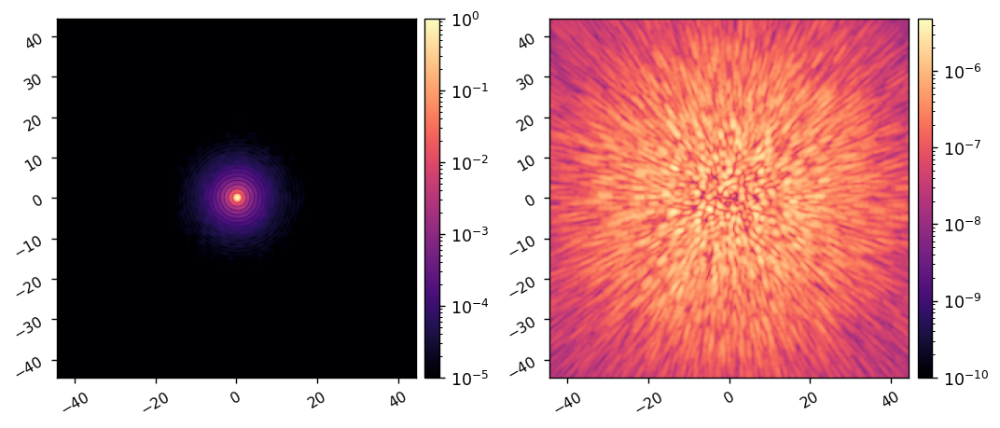

In [38]:
reload(fresnel)
I = fresnel.CORO(
    # dm1_ref=dm1_flat,
)
I = fresnel.CORO(
    # dm1_gains=1 + 0.02*xp.random.randn(96,96),
    # dm2_gains=1 + 0.02*xp.random.randn(96,96),
    # inf_fun_coupling=0.17,
    # dm1_shift=np.array([100, 25 ])*u.um,
    # dm2_shift=np.array([-25, -100 ])*u.um,
    # lyot_shift=np.array([-50, -50 ])*u.um,
    dm1_ref=dm1_flat,
)
I.use_opds = True
I.bandpasses = bandpasses 

I.use_vortex = False
ref_psf = I.snap()
I.Imax_ref = xp.max(ref_psf)
ref_psf /= I.Imax_ref
I.use_vortex = True
ref_coro_im = I.snap()

imshow2(ref_psf, ref_coro_im,
        pxscl=I.psf_pixelscale_lamDc, lognorm=True, vmin1=1e-5, vmin2=1e-10)


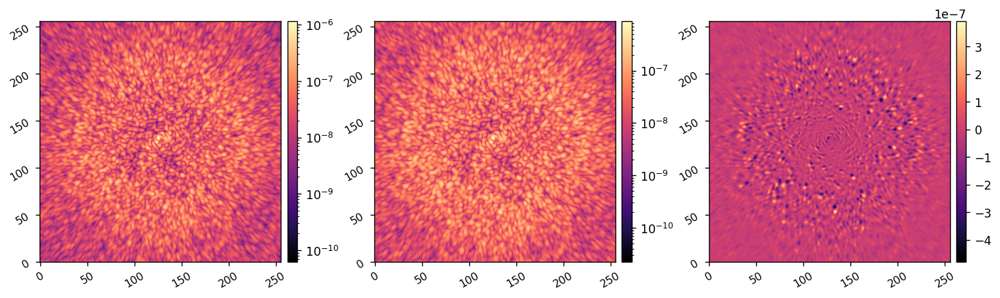

In [24]:
im_bp1 = I.snap(1)
im_bp3 = I.snap(3)
diff = im_bp3 - im_bp1
imshow3(im_bp1, im_bp3, diff, lognorm1=True, lognorm2=True, )

In [8]:
est_waves

array([6.25625e-07, 6.50000e-07, 6.74375e-07])

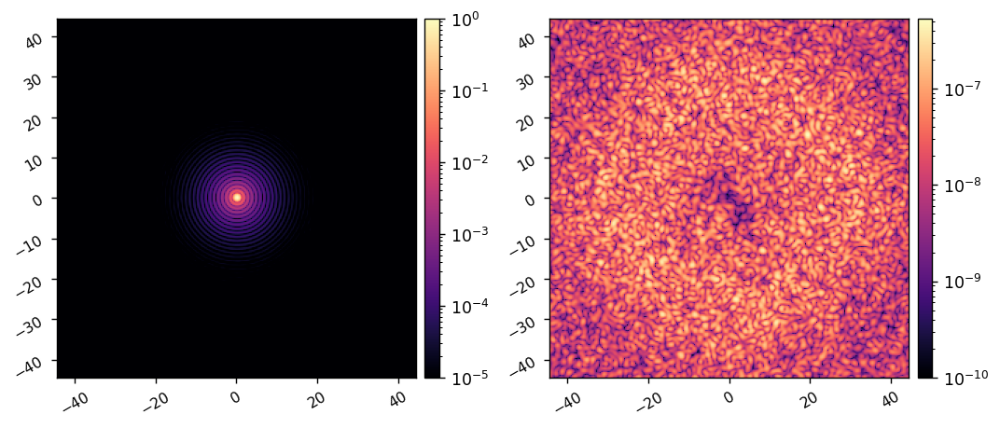

In [25]:
reload(fraunhofer)
M = fraunhofer.MODEL()
M.AMP = AMP
M.OPD = OPD

M.flip_dm = True
M.flip_lyot = True

acts = xp.zeros(M.Nacts)

model_psf = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=0) )**2
M.setattr('Imax_ref', xp.max(model_psf))
model_psf /= M.Imax_ref

model_coro_im = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=1) )**2

imshow2(model_psf, model_coro_im,
        pxscl=M.psf_pixelscale_lamDc, lognorm=True, vmin1=1e-5, vmin2=1e-10)

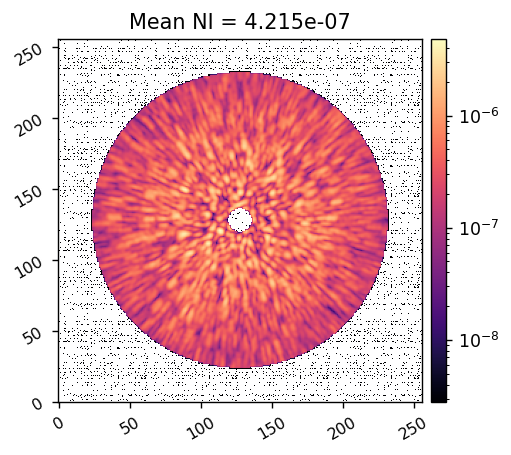

In [39]:
reload(utils)
I.reset_dms()
iwa = 3
owa = 36
rot = 0
control_mask = utils.create_annular_focal_plane_mask(I.npsf, I.psf_pixelscale_lamDc, irad=iwa, orad=owa, edge=None, rotation=rot)
# control_mask = utils.create_annular_focal_plane_mask(I.npsf, I.psf_pixelscale_lamDc, irad=iwa, orad=owa, edge=iwa, rotation=rot)
mean_ni = xp.mean(ref_coro_im[control_mask])

imshow1(ref_coro_im*control_mask, f'Mean NI = {mean_ni:.3e}', lognorm=True)

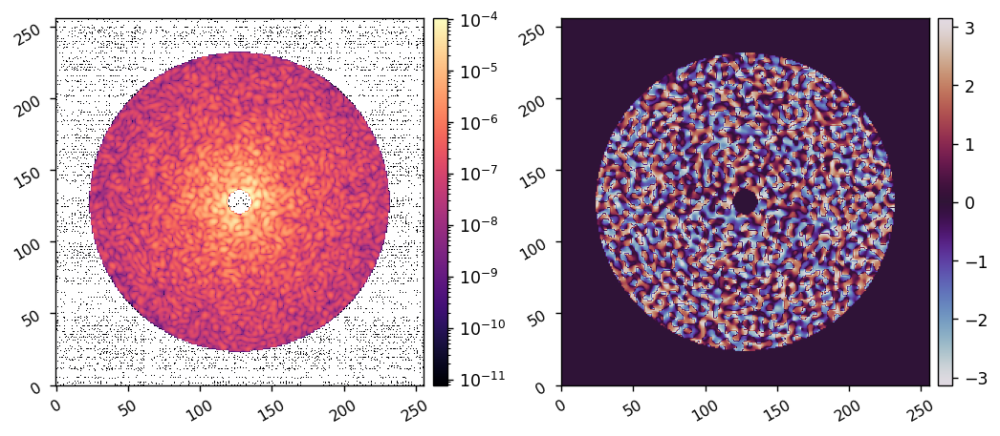

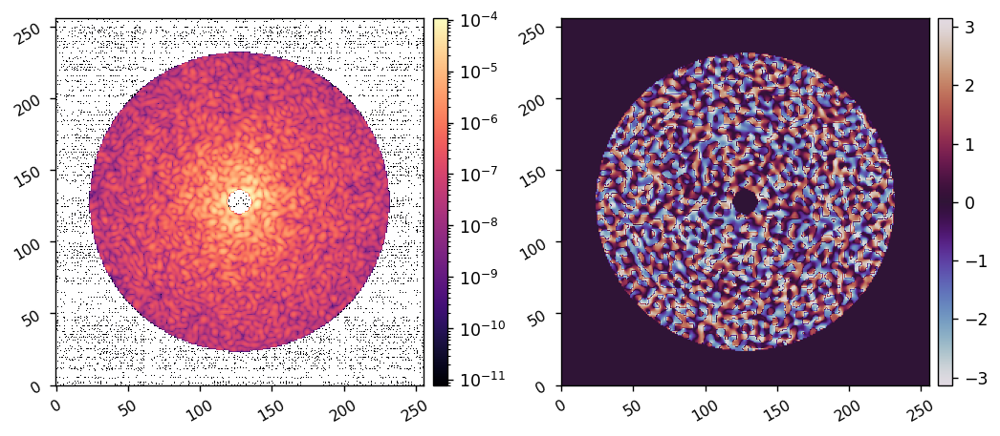

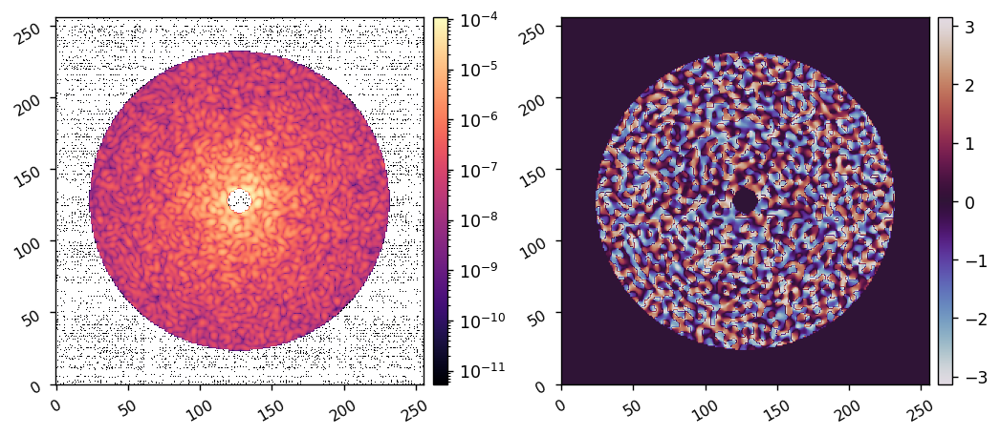

In [52]:
reload(aefc)
E_abs = aefc.calc_wfs(I, control_waves, control_mask, plot=1)


	Cost-function J_delE: 0.026
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 1.000

	Cost-function J_delE: 0.025
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 1.000

	Cost-function J_delE: 0.023
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.023
	Total cost-function value: 1.000



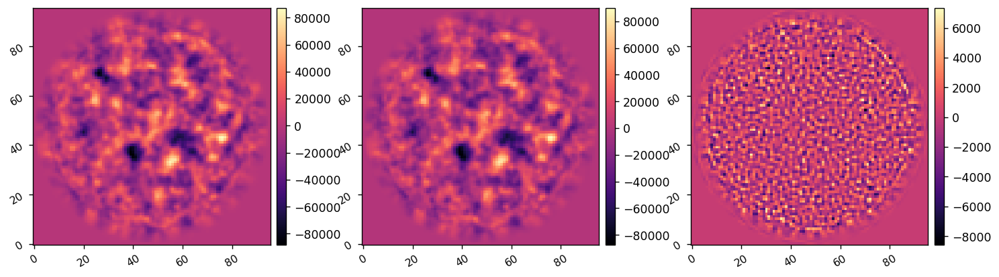

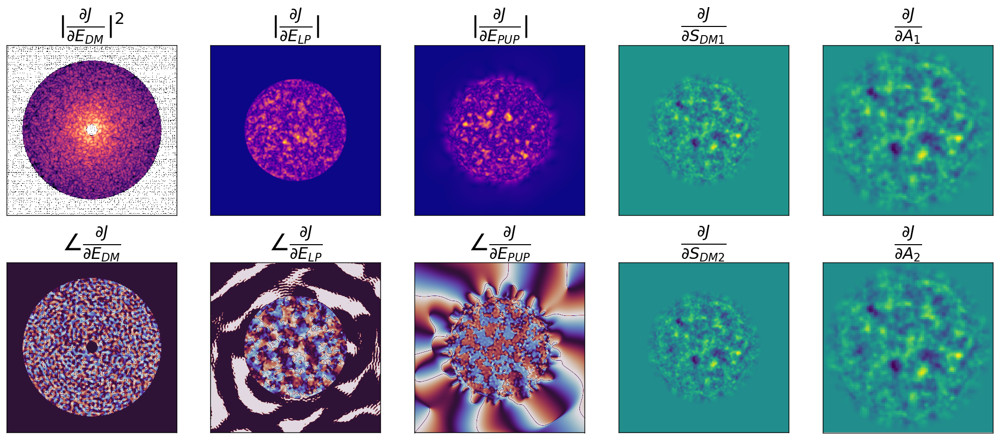

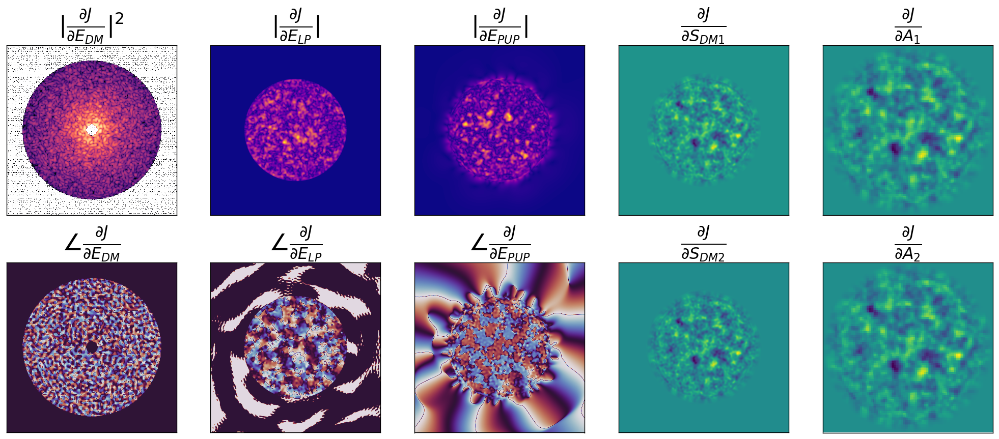

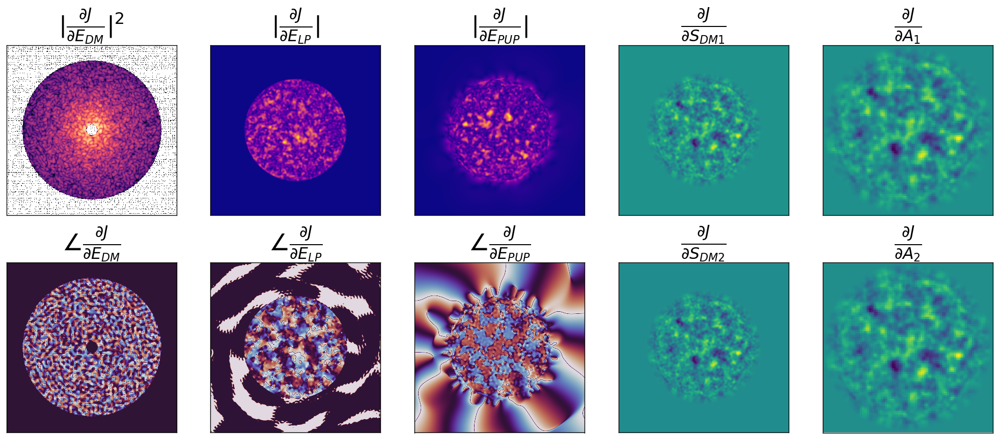

In [7]:
reload(fraunhofer)

current_acts = xp.zeros(M.Nacts)
# current_acts = fits.getdata('ad_test_acts.fits')

I.reset_dms()
I.add_dm1(fraunhofer.acts_to_command(current_acts[:M.Nacts//2], M.dm_mask))
I.add_dm2(fraunhofer.acts_to_command(current_acts[M.Nacts//2:], M.dm_mask))

E_abs = aefc.calc_wfs(I, control_waves, control_mask, plot=0)
E_FP_NOMs, E_EPs, E_DM2Ps, DM1_PHASORs, DM2_PHASORs = aefc.get_forward_vars(M, current_acts, control_waves)

rmad_vars = { 
    'current_acts':current_acts,
    'E_abs':E_abs, 
    'E_FP_NOMs':E_FP_NOMs,
    'E_EPs':E_EPs,
    'E_DM2Ps':E_DM2Ps,
    'DM1_PHASORs':DM1_PHASORs,
    'DM2_PHASORs':DM2_PHASORs,
    'control_mask':control_mask,
    'control_waves':control_waves,
    'r_cond':1e-3,
    'weights':None,
    # 'weights':np.array([10,1,10]), 
}

del_acts = np.zeros(M.Nacts)
J, dJ_dA = fraunhofer.val_and_grad_bb(
    del_acts, 
    M, rmad_vars, 
    verbose=True, 
    # plot=True, 
    fancy_plot=True,
)

dm1_grad = fraunhofer.acts_to_command(dJ_dA[:M.Nacts//2], M.dm_mask)
dm2_grad = fraunhofer.acts_to_command(dJ_dA[M.Nacts//2:], M.dm_mask)
imshow3(dm1_grad, dm2_grad, dm2_grad-dm1_grad)

In [54]:
reload(fraunhofer)
reload(aefc)

current_acts = xp.zeros(M.Nacts)
# current_acts = fits.getdata('ad_test_acts.fits')

I.reset_dms()
I.add_dm1(fraunhofer.acts_to_command(current_acts[:M.Nacts//2], M.dm_mask))
I.add_dm2(fraunhofer.acts_to_command(current_acts[M.Nacts//2:], M.dm_mask))

E_abs = aefc.calc_wfs(I, control_waves, control_mask, plot=0)
E_FP_NOMs, E_EPs, E_DM2Ps, DM1_PHASORs, DM2_PHASORs = aefc.get_forward_vars(M, current_acts, control_waves)

rmad_vars = { 
    'current_acts':current_acts,
    'E_abs':E_abs, 
    'E_FP_NOMs':E_FP_NOMs,
    'E_EPs':E_EPs,
    'E_DM2Ps':E_DM2Ps,
    'DM1_PHASORs':DM1_PHASORs,
    'DM2_PHASORs':DM2_PHASORs,
    'control_mask':control_mask,
    'control_waves':control_waves,
    'r_cond':1e-3,
    'weights':None,
    # 'weights':np.array([10,1,10]), 
}

bfgs_tol = 1e-3
bfgs_opts = {
    'disp':True,
    # 'maxls':50,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

del_acts0 = np.zeros(M.Nacts)
res = minimize(
    fraunhofer.val_and_grad_bb, 
    jac=True, 
    x0=del_acts0,
    args=(M, rmad_vars, True, False), 
    method='L-BFGS-B',
    tol=bfgs_tol,
    options=bfgs_opts,
)


	Cost-function J_delE: 0.026
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 1.000

	Cost-function J_delE: 0.025
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 1.000

	Cost-function J_delE: 0.023
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.023
	Total cost-function value: 1.000

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  8.99053D+04
	Cost-function J_delE: 0.056
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 2.145



 This problem is unconstrained.


	Cost-function J_delE: 0.052
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 2.120

	Cost-function J_delE: 0.046
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.023
	Total cost-function value: 1.945

	Cost-function J_delE: 0.101
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 3.863

	Cost-function J_delE: 0.097
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 3.925

	Cost-function J_delE: 0.096
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.023
	Total cost-function value: 4.097

	Cost-function J_delE: 1.197
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 45.825

	Cost-function J_delE: 1.211
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 48.987

	Cost-function J_delE: 1.217
	Cost-function J_c: 0.000
	Cost-functi

7.375895756033868e-07 8.976390295822621e-09


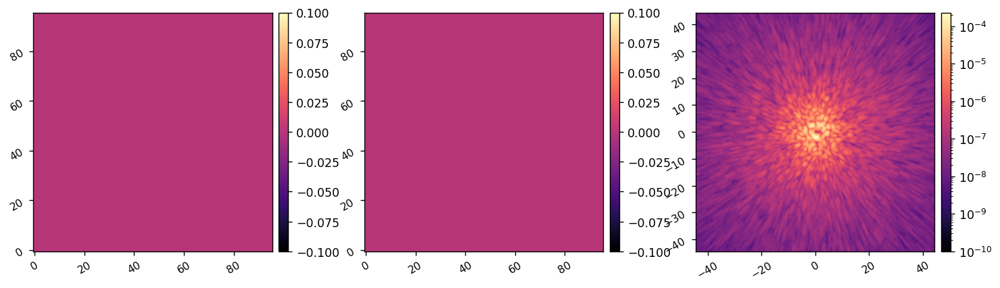

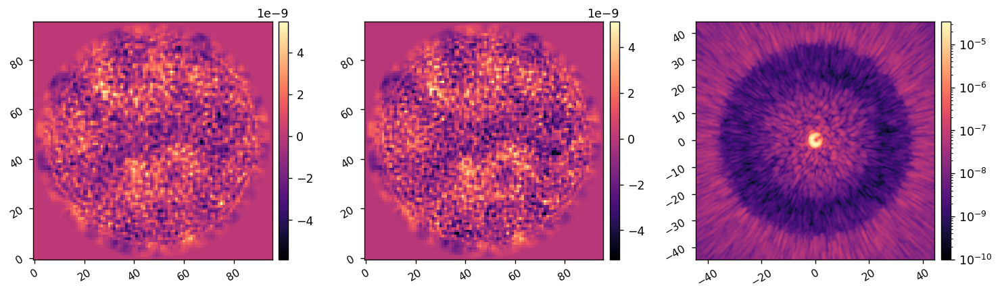

In [55]:
I.reset_dms()
old_dm1 = I.get_dm1()
old_dm2 = I.get_dm2()
old_im = I.snap()

del_dm1 = fraunhofer.acts_to_command(res.x[:M.Nacts//2], I.dm_mask)
del_dm2 = fraunhofer.acts_to_command(res.x[M.Nacts//2:], I.dm_mask)
I.add_dm1(del_dm1)
I.add_dm2(del_dm2)
new_im = I.snap()

print(xp.mean(old_im[control_mask]), xp.mean(new_im[control_mask]))
imshow3(old_dm1, old_dm2, old_im, lognorm3=True, pxscl3=I.psf_pixelscale_lamDc, vmin3=1e-10,)
imshow3(del_dm1, del_dm2, new_im, lognorm3=True, pxscl3=I.psf_pixelscale_lamDc, vmin3=1e-10,)

In [18]:
utils.save_fits('ad_test_acts.fits', res.x)

Saved data to:  ad_test_acts.fits


In [8]:
I.reset_dms()
data = {
    # 'ref_im':ref_coro_im, 
    'images':[ref_coro_im],
    'efields':[],
    'dm1_commands':[],
    'del_dm1_commands':[],
    'dm2_commands':[],
    'del_dm2_commands':[],
    'reg_conds':[],
    'bfgs_tols':[],
    'pixelscale':I.psf_pixelscale_lamDc,
    'control_mask':control_mask, 
}

Computing E-field with model ...
Computing EFC command with L-BFGS


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  2.72804D+06

At iterate    1    f=  9.95260D-01    |proj g|=  2.38914D+06

At iterate    2    f=  9.75148D-01    |proj g|=  5.36910D+05

At iterate    3    f=  9.71898D-01    |proj g|=  6.19046D+05

At iterate    4    f=  9.60157D-01    |proj g|=  5.90296D+05

At iterate    5    f=  9.53617D-01    |proj g|=  6.86848D+05

At iterate    6    f=  9.46260D-01    |proj g|=  4.05504D+05

At iterate    7    f=  9.41054D-01    |proj g|=  3.33284D+05

At iterate    8    f=  9.35886D-01    |proj g|=  5.77220D+05

At iterate    9    f=  9.29144D-01    |proj g|=  5.31726D+05

At iterate   10    f=  9.20095D-01    |proj g|=  4.40854D+05

At iterate   11    f=  9.13482D-01    |proj g|=  7.02527D+05

At iterate   12    f=  9.07670D-01    |proj g|=  4.85336D+05

At iterate   13    f=  9.0

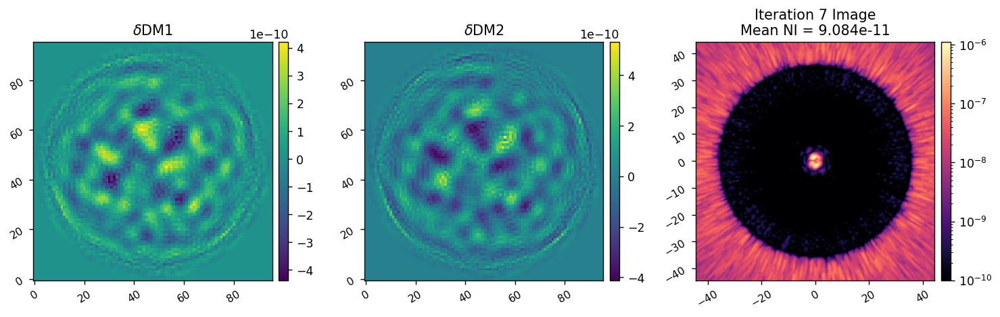

Computing E-field with model ...
Computing EFC command with L-BFGS
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  1.82249D+06


 This problem is unconstrained.



At iterate    1    f=  9.97332D-01    |proj g|=  1.60633D+06

At iterate    2    f=  9.85863D-01    |proj g|=  4.65848D+05

At iterate    3    f=  9.83940D-01    |proj g|=  4.87707D+05

At iterate    4    f=  9.76883D-01    |proj g|=  4.75206D+05

At iterate    5    f=  9.74599D-01    |proj g|=  1.18369D+06

At iterate    6    f=  9.70444D-01    |proj g|=  4.61341D+05

At iterate    7    f=  9.68111D-01    |proj g|=  3.87340D+05

At iterate    8    f=  9.66133D-01    |proj g|=  3.63889D+05

At iterate    9    f=  9.63149D-01    |proj g|=  4.17607D+05

At iterate   10    f=  9.61722D-01    |proj g|=  8.63916D+05

At iterate   11    f=  9.58529D-01    |proj g|=  2.58226D+05

At iterate   12    f=  9.56833D-01    |proj g|=  3.56406D+05

At iterate   13    f=  9.53911D-01    |proj g|=  4.79407D+05

At iterate   14    f=  9.50436D-01    |proj g|=  1.01544D+06

At iterate   15    f=  9.46263D-01    |proj g|=  4.59943D+05

At iterate   16    f=  9.43681D-01    |proj g|=  2.79752D+05

At iter

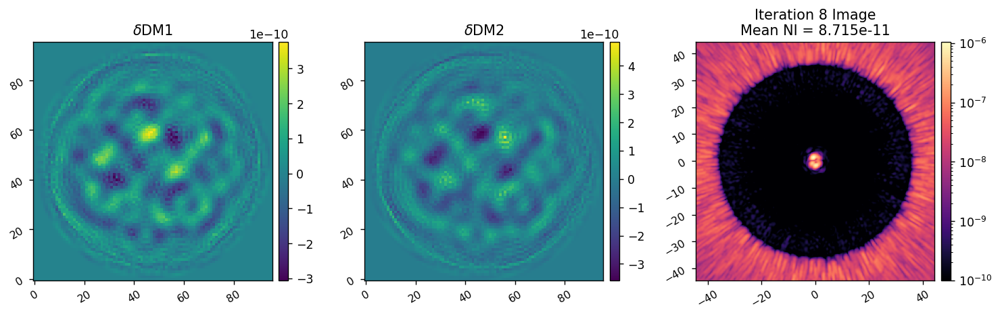

Computing E-field with model ...
Computing EFC command with L-BFGS
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  1.74318D+06


 This problem is unconstrained.



At iterate    1    f=  9.98716D-01    |proj g|=  1.51212D+06

At iterate    2    f=  9.92591D-01    |proj g|=  4.98116D+05

At iterate    3    f=  9.91087D-01    |proj g|=  5.32666D+05

At iterate    4    f=  9.86587D-01    |proj g|=  5.51482D+05

At iterate    5    f=  9.84371D-01    |proj g|=  1.16930D+06

At iterate    6    f=  9.81126D-01    |proj g|=  4.91517D+05

At iterate    7    f=  9.78847D-01    |proj g|=  3.62833D+05

At iterate    8    f=  9.76911D-01    |proj g|=  4.01995D+05

At iterate    9    f=  9.75219D-01    |proj g|=  8.15950D+05

At iterate   10    f=  9.72742D-01    |proj g|=  3.95743D+05

At iterate   11    f=  9.70991D-01    |proj g|=  2.98265D+05

At iterate   12    f=  9.69021D-01    |proj g|=  4.04936D+05

At iterate   13    f=  9.67255D-01    |proj g|=  1.13520D+06

At iterate   14    f=  9.64576D-01    |proj g|=  3.89137D+05

At iterate   15    f=  9.62575D-01    |proj g|=  3.35793D+05

At iterate   16    f=  9.60816D-01    |proj g|=  4.04208D+05

At iter

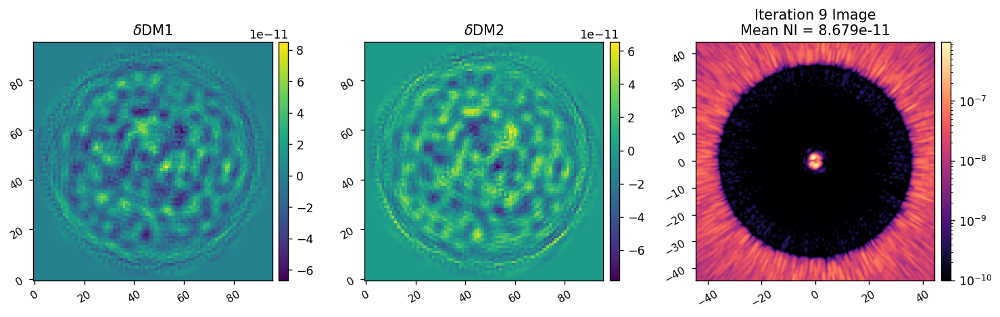

In [11]:
reload(fraunhofer)
reload(aefc)

# r_cond = 1e4
# r_cond = 1e3
# r_cond = 1e2
r_cond = 1e1
# r_cond = 1e0
# r_cond = 1e-1
# r_cond = 1e-2
# r_cond = 1e-3
# r_cond = 1e-4
# r_cond = 1e-5
# r_cond = 1e-6
# r_cond = 1e-7
# r_cond = 1e-8
# r_cond = 1e-9
# r_cond = 1e-10
# r_cond = 1e-11
# r_cond = 1e-12
# r_cond = 0

bfgs_tol = 1e-2
bfgs_tol = 1e-3
# bfgs_tol = 1e-4
# bfgs_tol = 1e-5
# bfgs_tol = 1e-10

bfgs_opts = {
    'disp':True,
    'maxls':100, 
    'maxiter':50,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

data = aefc.run_bb(
    I, 
    M, 
    fraunhofer.val_and_grad_bb, 
    control_mask, 
    data,
    Nitr=3, 
    reg_cond=r_cond,
    # weights=np.array([20,1,20]), 
    bfgs_tol=bfgs_tol,
    bfgs_opts=bfgs_opts,
    gain=1,
)



In [12]:
from datetime import datetime
today = int(datetime.today().strftime('%Y%m%d'))
utils.save_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{today}_aefc_run_without_ME.pkl', data)

Saved data to:  /npool/nvme/kianmilani/aefc-vortex-data/20241202_aefc_run_without_ME.pkl


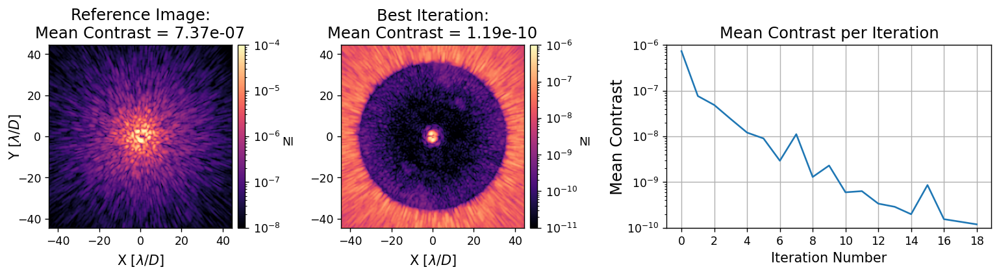

In [24]:
plot_data(data, im1vmin=1e-8, im1vmax=1e-4, im2vmin=1e-11, im2vmax=1e-6, vmin=1e-10, vmax=1e-6)

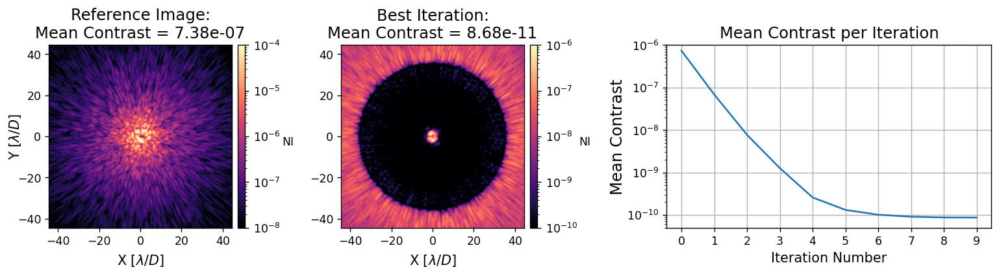

In [18]:
plot_data(
    data, 
    im1vmin=1e-8, im1vmax=1e-4, 
    im2vmin=1e-10, im2vmax=1e-6, 
    vmin=5e-11, vmax=1e-6,
    xticks=np.linspace(0,9,10),
)

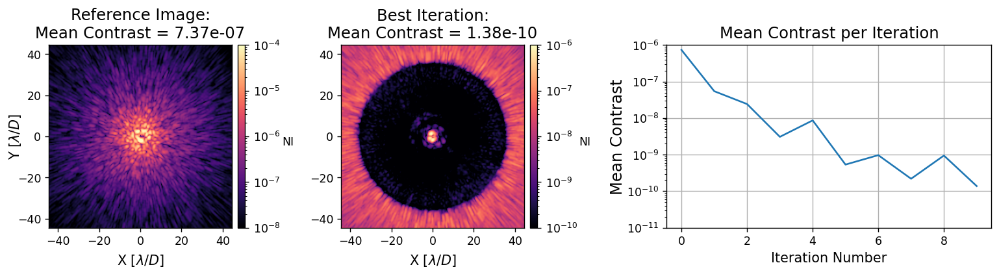

In [11]:
plot_data(data, im1vmin=1e-8, im1vmax=1e-4, im2vmin=1e-10, im2vmax=1e-6, vmin=1e-11, vmax=1e-6)

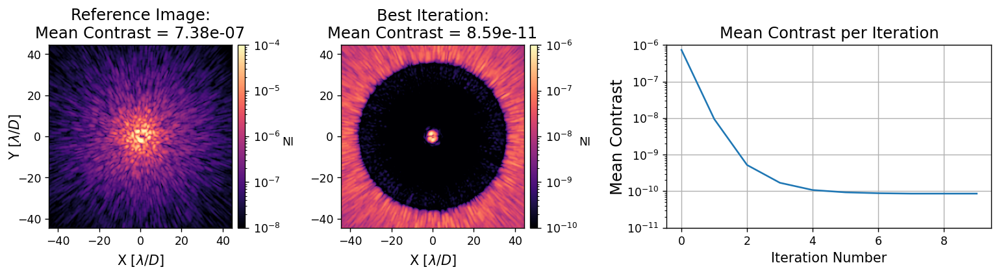

In [71]:
plot_data(data, im1vmin=1e-8, im1vmax=1e-4, im2vmin=1e-10, im2vmax=1e-6, vmin=1e-11, vmax=1e-6)

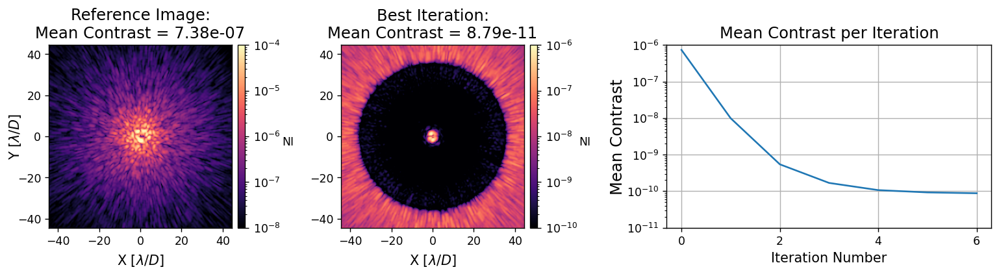

In [66]:
plot_data(data, im1vmin=1e-8, im1vmax=1e-4, im2vmin=1e-10, im2vmax=1e-6, vmin=1e-11, vmax=1e-6)